## NASDAQ Stock Clustering using K-Means


This machine learning project is about clustering similar companies with K-means clustering algorithm. The similarity is based on their annual performance.So basically the stocks are grouped according to their annual return and volatility.Here we have taken over 200 companies listed on the NASDAQ stock exchange into consideration.

# Data
 
The information such as opening and closing prices,Highs and Lows and Volumes of over 200 Companies listed on NASDAQ were scrapped from Yahoo Finance using the yfinance api.

# Environment and tools
 

1.Scikit-Learn

2.Plotly

3.Numpy

4.Pandas

5.Matplotlib

# K-Means Clustering Algorithm
 

1.Specify number of clusters K.

2.Initialize centroids by first shuffling the dataset and then randomly selecting K data points for the centroids without replacement.

3.Keep iterating until there is no change to the centroids. i.e assignment of data points to clusters isn’t changing

In [1]:
##!pip install pandas_datareader
##!pip install yfinance
import yfinance as yf
from pandas_datareader.data import DataReader
import matplotlib.pyplot as plt
import pandas as pd
import datetime
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [2]:

k=['CSCO','BAND','SIRI','PAYX','NXPI','MXIM','KLAC','JD','REGN','BKNG','MYL','ULTA','VRSK','TTWO','LBTYA','MAR','MELI','AMD','CDNS','HAS','ISRG','ASML','ADI','SWKS','TTWO','TMUS','PCAR','ROST','LULU','PAYX','ORLY','MNST','MYL','WWE','FAST','EBAY','CERN','EXC','ADP','BMRN','BIDU','AMAT','BIIB','ADSK','ALXN','CTXS','CTSH','EA','CTAS','TCOM','BANF','BANFP','BANR','BANX','BASI','BATRA','BATRK','BBBY','BBCP','BBGI','BBH','BBIO','BCEL','BBSI','BCBP','BCDA','BCML','BCLI','BCOR','BCOM','BCOW','BCOV','BCPC','BCYC','BWAY','BUSE','BWEN','BWFG','BTAI','BSVN','BSTC','BTEC','BVXV','BWMX','BXRX','BYND','BYFC','BZUN','BSRR','BSCT','BSCS','BSDE','BSET','BSJK','BSJO','BSJL','BSGM','BSJM','BSJN','BSJP','BSJQ','BSMN','BSMR','BSMQ','BSMO','BSML','BSJR','BSMM','BSMP','BSQR','BBGI','SBUX','BBQ','TXN','COST','PYPL','NFLX','NVDA','ADBE','FB','GOOGL','AAME','AAOI','AAON','AAPL','AAL','AAWW','AAXJ','AAXN','ABCB','ABEO','ABIO','ABMD','ABTX','ABUS','ACAD','ACAM','ACGLP','ACHC','ACHV','ACIA','ACIU','ACIW','ACMR','ACOR','ACRX','ACST','ACT','ACTG','ACTT','ACTTU','ACWI','ACWX','ADES','ADRE','ADTN','ADVM','ADXN','AEGN','AEHR','AEMD','AESE','AEY','AEZS','AFIN','AFINP','AFMD','AFYA','AGIO','AAL','AACG','AMZN', 'AAPL','TSLA','WBA', 'NOC', 'BA', 'LMT', 'MCD', 'INTC', 'NAV', 'IBM', 'TXN', 'MA', 'MSFT', 'GE', 'AXP', 'PEP', 'KO', 'JNJ', 'TM', 'HMC', 'MSBHY', 'SNE', 'XOM', 'CVX', 'VLO', 'F', 'BAC','MU','ISRG','TMUS','CME','ADP','INTU','BKNG','FISV','MDLZ','GILD','QCOM','XEL']
k = list(dict.fromkeys(k))
k.sort()
len(k)

200

In [3]:
stocks_df = yf.download('AAPL', 
                      start='2015-01-01', 
                      end='2020-6-30', 
                      progress=False)
stocks_df.tail()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-06-23,364.000000,372.380005,362.269989,366.529999,366.529999,53038900
2020-06-24,365.000000,368.790009,358.519989,360.059998,360.059998,48155800
2020-06-25,360.700012,365.000000,357.570007,364.839996,364.839996,34380600
2020-06-26,364.410004,365.320007,353.019989,353.630005,353.630005,51314200
2020-06-29,353.250000,362.170013,351.279999,361.779999,361.779999,32661500


In [4]:
stocks_df = yf.download(k, 
                      start='2018-01-01', 
                      end='2020-6-30', 
                      progress=False)
stocks_df.head()


Adj Close                                                         \
                AACG        AAL      AAME       AAOI       AAON        AAPL   
Date                                                                          
2018-01-02      5.43  51.647556  3.204487  37.910000  36.240726  166.353714   
2018-01-03      5.34  51.014027  3.303086  37.889999  36.878246  166.324722   
2018-01-04      5.40  51.335667  3.204487  38.380001  36.731129  167.097290   
2018-01-05      5.40  51.316177  3.598885  38.889999  37.319611  168.999741   
2018-01-08      5.27  50.809345  3.303086  38.369999  36.731129  168.372040   

                                                        ...   Volume           \
                 AAWW       AAXJ       AAXN       ABCB  ...     TSLA     TTWO   
Date                                                    ...                     
2018-01-02  57.950001  74.602440  26.549999  46.844578  ...  4352200  1569300   
2018-01-03  58.299999  75.253822  26.750000  47.037548  ...  4521500  1451500   
2018-01-04  59.250000  75.378349  26.830000  47.519985  ...  9946300  1319300   
2018-01-05  56.549999  76.068047  26.850000  48.629597  ...  4591200  1513600   
2018-01-08  56.299999  76.144684  26.770000  48.629597  ...  9859400  1591400   

                                                                           \
                TXN     ULTA      VLO    VRSK       WBA      WWE      XEL   
Date                                                                        
2018-01-02  4236200   972900  3582900  653900   6605000   826000  2443400   
2018-01-03  6918900  1975000  3057600  760200   7147300   776800  4114900   
2018-01-04  5460400  1250600  2977000  960300  12456000  1048100  2807000   
2018-01-05  5254900  1811000  2973800  882100   9067200   994300  3728000   
2018-01-08  4549400  1348900  2493400  791600   5312500   622400  3837600   

                      
                 XOM  
Date                  
2018-01-02  11469300  
2018-01-03  13957700  
2018-01-04  10863000  
2018-01-05  11047600  
2018-01-08  10927100  

[5 rows x 1200 columns]

In [5]:
stock_open = np.array(stocks_df['Open']).T # stock_open is numpy array of transpose of df['Open']
stock_close = np.array(stocks_df['Close']).T # stock_close is numpy array of transpose of df['Close']


# Plotting the Opening Prices for Some Top Companies

In [6]:
fig=px.line(stocks_df['Open']['MSFT'],x=stocks_df.index[...],y=stocks_df['Open']['MSFT'],labels={'x':'Time','y':'Opening Price'},title="Company:Microsoft")
fig.show()
fig=px.line(stocks_df['Close']['MSFT'],x=stocks_df.index[...],y=stocks_df['Close']['MSFT'],labels={'x':'Time','y':'Closing Price'},title="Company:Microsoft")
fig.show()

fig = go.Figure()
fig.add_trace(go.Scatter(x=stocks_df.index[...], y=stocks_df['Open']['MSFT'],
                    mode='lines',
                    name='Opening Price'))
fig.add_trace(go.Scatter(x=stocks_df.index[...], y=stocks_df['Close']['MSFT'],
                    mode='lines',
                    name='Closing Price'))
fig.update_layout(title='Opening and Closing Prices',
                   xaxis_title='Time',
                   yaxis_title='Prices')


fig.show()

In [7]:
fig=px.line(stocks_df['Open']['AAPL'],x=stocks_df.index[...],y=stocks_df['Open']['AAPL'],labels={'x':'Time','y':'Opening Price'},title="Company:Apple" )
fig.show()
fig=px.line(stocks_df['Close']['AAPL'],x=stocks_df.index[...],y=stocks_df['Close']['AAPL'],labels={'x':'Time','y':'Closing Price'},title="Company:Apple" )
fig.show()
fig = go.Figure()
fig.add_trace(go.Scatter(x=stocks_df.index[...], y=stocks_df['Open']['AAPL'],
                    mode='lines',
                    name='Opening Price'))
fig.add_trace(go.Scatter(x=stocks_df.index[...], y=stocks_df['Close']['AAPL'],
                    mode='lines',
                    name='Closing Price'))
fig.update_layout(title='Opening and Closing Prices',
                   xaxis_title='Time',
                   yaxis_title='Prices')


fig.show()

In [8]:
fig=px.line(stocks_df['Open']['TSLA'],x=stocks_df.index[...],y=stocks_df['Open']['TSLA'],labels={'x':'Time','y':'Opening Price'},title="Company:Tesla")
fig.show()
fig=px.line(stocks_df['Close']['TSLA'],x=stocks_df.index[...],y=stocks_df['Close']['TSLA'],labels={'x':'Time','y':'Closing Price'},title="Company:Tesla" )
fig.show()
fig = go.Figure()
fig.add_trace(go.Scatter(x=stocks_df.index[...], y=stocks_df['Open']['TSLA'],
                    mode='lines',
                    name='Opening Price'))
fig.add_trace(go.Scatter(x=stocks_df.index[...], y=stocks_df['Close']['TSLA'],
                    mode='lines',
                    name='Closing Price'))
fig.update_layout(title='Opening and Closing Prices',
                   xaxis_title='Time',
                   yaxis_title='Prices')


fig.show()

In [9]:
fig=px.line(stocks_df['Open']['AMZN'],x=stocks_df.index[...],y=stocks_df['Open']['AMZN'],labels={'x':'Time','y':'Opening Price'},title="Company:Amazon" )
fig.show()
fig=px.line(stocks_df['Close']['AMZN'],x=stocks_df.index[...],y=stocks_df['Close']['AMZN'],labels={'x':'Time','y':'Closing Price'},title="Company:Amazon" )
fig.show()
fig = go.Figure()
fig.add_trace(go.Scatter(x=stocks_df.index[...], y=stocks_df['Open']['AMZN'],
                    mode='lines',
                    name='Opening Price'))
fig.add_trace(go.Scatter(x=stocks_df.index[...], y=stocks_df['Close']['AMZN'],
                    mode='lines',
                    name='Closing Price'))
fig.update_layout(title='Opening and Closing Prices',
                   xaxis_title='Time',
                   yaxis_title='Prices')


fig.show()

### So we need the Adjusted Closing Price of the Stocks to Cluster them according to their Performance

In [10]:
prices=stocks_df['Adj Close']
np.array(prices.iloc[:,5])
prices.index[...]
prices.head()

,AACG,AAL,AAME,AAOI,AAON,AAPL,AAWW,AAXJ,AAXN,ABCB,...,TSLA,TTWO,TXN,ULTA,VLO,VRSK,WBA,WWE,XEL,XOM
Date,,,,,,,,,,,,,,,,,,,,,
2018-01-02,5.43,51.647556,3.204487,37.910000,36.240726,166.353714,57.950001,74.602440,26.549999,46.844578,...,320.529999,112.879997,98.604675,229.630005,83.818542,94.836853,69.553452,30.768972,44.432648,75.350937
2018-01-03,5.34,51.014027,3.303086,37.889999,36.878246,166.324722,58.299999,75.253822,26.750000,47.037548,...,317.250000,113.879997,101.275970,245.119995,84.261116,94.559753,70.073128,30.142038,44.135258,76.830833
2018-01-04,5.40,51.335667,3.204487,38.380001,36.731129,167.097290,59.250000,75.378349,26.830000,47.519985,...,314.619995,114.019997,101.145203,244.880005,84.532082,95.034775,66.444649,30.249788,43.791389,76.937187
2018-01-05,5.40,51.316177,3.598885,38.889999,37.319611,168.999741,56.549999,76.068047,26.850000,48.629597,...,316.579987,116.910004,101.920448,237.960007,84.929489,95.875977,67.669617,30.416319,43.484699,76.875137
2018-01-08,5.27,50.809345,3.303086,38.369999,36.731129,168.372040,56.299999,76.144684,26.770000,48.629597,...,336.410004,117.370003,102.406151,231.139999,85.101112,95.994728,68.532646,30.661219,43.809975,77.220741


In [11]:

fig = go.Figure()
for i in range(0,len(k),1):
          fig.add_trace(go.Scatter(x=prices.index[...], y=np.array(prices.iloc[:,i]),
                                                                      mode='lines',
                                                                      name=k[i]))

fig.update_layout(title='Adjusted Closing Prices',
                  
                   xaxis_title='Time',
                   yaxis_title='Prices')


fig.show()

In [12]:
from math import sqrt
start = "2019-06-01"
data = prices.loc[start:]
print(data.head())
#Calculating annual mean returns and variances
returns = data.pct_change().mean() * 252
variance = data.pct_change().std() * sqrt(252)
returns.columns = ["Returns"]
variance.columns = ["Variance"]
#Concatenating the returns and variances into a single data-frame
ret_var = pd.concat([returns, variance], axis = 1).dropna()
ret_var.columns = ["Returns","Variance"]
X=ret_var.values
ret_var.head()

            AACG        AAL  AAME  AAOI       AAON        AAPL       AAWW  \
Date                                                                        
2019-06-03  1.80  26.917612  2.37  8.81  45.551907  171.256134  37.009998   
2019-06-04  1.83  28.817678  2.37  9.19  47.478874  177.521378  39.700001   
2019-06-05  1.84  30.044806  2.37  9.23  47.756996  180.387146  38.619999   
2019-06-06  1.99  30.064596  2.45  9.30  47.856319  183.035568  37.990002   
2019-06-07  1.99  30.598989  2.45  9.50  48.521816  187.907410  39.880001   

                 AAXJ       AAXN       ABCB  ...        TSLA        TTWO  \
Date                                         ...                           
2019-06-03  64.858925  67.459999  35.059502  ...  178.970001  105.949997   
2019-06-04  64.985970  67.629997  36.377892  ...  193.600006  108.989998   
2019-06-05  64.663483  68.000000  36.163048  ...  196.589996  111.550003   
2019-06-06  64.712341  67.970001  36.036091  ...  205.949997  110.669998   
2019

,Returns,Variance
AACG,-0.060757,0.828784
AAL,-0.232453,0.940250
AAME,0.177964,1.037566
AAOI,0.325642,0.728043
AAON,0.283762,0.519181


Calculate the Within-Cluster-Sum of Squared Errors (WSS) for different values of k, and choose the k for which WSS first starts to diminish. In the plot of WSS-versus-k, this is visible as an elbow.

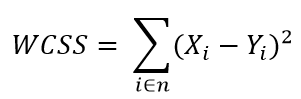
where Yi is centroid for observation Xi.

Recall that, the basic idea behind partitioning methods, such as k-means clustering, is to define clusters such that the total intra-cluster variation [or total within-cluster sum of square (WSS)] is minimized. The total WSS measures the compactness of the clustering and we want it to be as small as possible.

In [13]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans
from sklearn import metrics
sse = []
n = []
for i in range(2, 20):
    n.append(i)
    model = KMeans(n_clusters=i,init='k-means++' )
    model.fit(X)
    sse.append(model.inertia_)
   


fig=px.line(x = n,y = sse,labels={'x':'Value of K','y':'Intra Cluster Variation'},title="K vs Intra Cluster Variation")
fig.show()


#### As per the elbow graph,the best value for K would be 4

In [14]:
g=np.array(X)
model = KMeans(n_clusters=4)
y_pred = model.fit_predict(X)
ret_var["Target"] = y_pred
ret_var.head()

,Returns,Variance,Target
AACG,-0.060757,0.828784,0
AAL,-0.232453,0.940250,0
AAME,0.177964,1.037566,1
AAOI,0.325642,0.728043,1
AAON,0.283762,0.519181,1


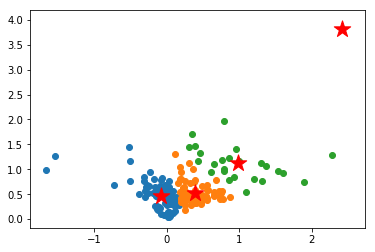

In [15]:
cent = model.cluster_centers_
for i in ret_var.Target.unique():
    newDf = ret_var[ret_var.Target == i]
    x = newDf.iloc[:, 0:].values
    plt.scatter(x[:,0], x[:,1])
    
    
 
for i in cent:
    plt.scatter(i[0], i[1], s = 300, marker="*", color = "Red")

plt.show()

### So we have got outliers,let us remove the outliers

In [16]:
print(returns.idxmax())##finidng outlier
ret_var.drop("ABIO", inplace =True)##removing Outlier
X=ret_var

ABIO


In [56]:
g=np.array(X)
model1 = KMeans(n_clusters=4)
y_pred1 = model1.fit_predict(X)
ret_var["Target1"] = y_pred1
ret_var.head()

,Returns,Variance,Target,Target1
AACG,-0.060757,0.828784,0,2
AAL,-0.232453,0.940250,0,2
AAME,0.177964,1.037566,1,0
AAOI,0.325642,0.728043,1,0
AAON,0.283762,0.519181,1,0


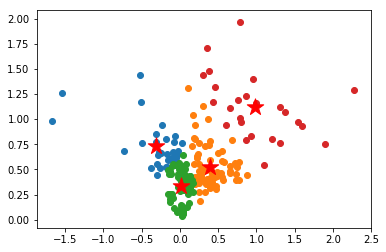

In [57]:
cent1 = model1.cluster_centers_
for i in ret_var.Target1.unique():
    newDf = ret_var[ret_var.Target1 == i]
    x = newDf.iloc[:, 0:].values
    plt.scatter(x[:,0], x[:,1])
    
    
 
for i in cent1:
    plt.scatter(i[0], i[1], s = 300, marker="*", color = "Red")

plt.show()

# Let us Now Implement the K-Means Algorithm from Scratch

In [22]:
k=4
epoch =100000

def Distance2point(point1,point2):##distance between 2 points
    dis=sum((point1-point2)**2)**0.2
    return dis

##centroid
##classes(groups)



##create 2 dic. and store centoids and class data points
##{"class no":Centroid}
##{"class no":datapoints}

##1st get random centroid
##2nd classify the datapoints into classes acc. to the random centroids for each class
##3rd run for loop to update centroid of each class acc. to the mean of the datapoints of a particular class
##compare new and old centroid if it has changed or not
def Kmean(data):
    centroids={}
    for i in range(k):
        centroids[i]=data[i]##getting random centroid based on k
    classes={}##groups
    for iteration in range(epoch):
        classes = {}
        for classKey in range(k):
            classes[classKey]=[]##blank list for eachclasses
            
        for datapoint in data:##for this data point we will check distance for all centroid if nearest to 1st centroid move to 1st class..and so on
            Distance=[] 
            for centroidKey in centroids:##we will pick one by one centroid to find distance
                centroidValue =centroids[centroidKey]##now we have centroid values,next find distance
                dis=Distance2point(datapoint,centroidValue)##finding distance of data points and centroid
                Distance.append(dis)
            minDis=min(Distance)##getting min. data
            minDisIndex=Distance.index(minDis)##found minimum data index
            classes[minDisIndex].append(datapoint)##classifying the datapoint by appending it in required class
         ##next we need to update centroid
        oldCentroids=dict(centroids)##storing old centroid
        for classKey in classes:##for each class we find mean to update the centroid
            classValue=classes[classKey]
            NewCentroid=np.mean(classValue,axis=0)
            centroids[classKey]=NewCentroid##upadting centroid
    ##now we need to check is the new centroid is updating or not..if not..then our algo is over
            
        isFine=True
        for centroidKey in centroids:
            NewcentroidValue =centroids[centroidKey]##getting all new centroid values
            OldcentroidValue =oldCentroids[centroidKey]##getting all old centroid values
            Diff=np.sum((NewcentroidValue-OldcentroidValue)/OldcentroidValue*100)##finding if difference exist
            if Diff> 0.00000001:## if diff. exist for this iteration
                isFine=False
                
                
        
        if isFine == True:##if no difference exist for this particular iteration,our algo is over break
            ##print(iteration)
            break
    return classes, centroids
        

In [54]:
classes, centroids = Kmean(np.array(ret_var))

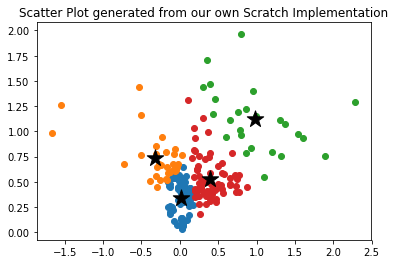

In [55]:
for classKey in classes:
    classData = np.array(classes[classKey])
    x = classData[:,0]
    y = classData[:,1]
    plt.scatter(x,y)
    
for centKey in centroids:
    centData = np.array(centroids[centKey])
    x = centData[0]
    y = centData[1]
    plt.title("Scatter Plot generated from our own Scratch Implementation")
    plt.scatter([x],[y],s = 300, marker="*", color = "black")
    

Scatter plot generated from Scikit-Learn
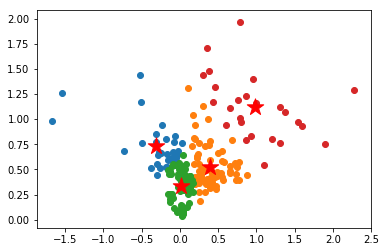

### So as visible they are quite similar,if not exactly same,this proves that our algorithm is accurate

In [58]:
from _pickle import dump
filename = 'Final_Model.sav'
dump(KMeans, open(filename, 'wb'))